# Final Project: Video Classification for Action Recognition

**Project Goal:** The goal for this project is to be able to correctly identify what action is being performed in a given video.

**Dataset:** The dataset used in this project is from the UCF101 dataset.

**Source:** https://www.crcv.ucf.edu/data/UCF101.php

This dataset contains 101 categories of videos and are grouped into 25 groups. The groups are listed below. I used this notebook to develop a subsample to train with. https://colab.research.google.com/github/sayakpaul/Action-Recognition-in-TensorFlow/blob/main/Data_Preparation_UCF101.ipynb In order to keep the runtime manageable and not use too much memory we used a small sample size with the top 20 actions.




In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GRU
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

In [ ]:
import matplotlib.pyplot as plt

# Exploratory Data Analysis

In [ ]:
classes = "/content/ucfTrainTestlist/classInd.txt"
with open(classes, 'r') as file:
  content = file.read()
  print(content)

1 ApplyEyeMakeup
2 ApplyLipstick
3 Archery
4 BabyCrawling
5 BalanceBeam
6 BandMarching
7 BaseballPitch
8 Basketball
9 BasketballDunk
10 BenchPress
11 Biking
12 Billiards
13 BlowDryHair
14 BlowingCandles
15 BodyWeightSquats
16 Bowling
17 BoxingPunchingBag
18 BoxingSpeedBag
19 BreastStroke
20 BrushingTeeth
21 CleanAndJerk
22 CliffDiving
23 CricketBowling
24 CricketShot
25 CuttingInKitchen
26 Diving
27 Drumming
28 Fencing
29 FieldHockeyPenalty
30 FloorGymnastics
31 FrisbeeCatch
32 FrontCrawl
33 GolfSwing
34 Haircut
35 Hammering
36 HammerThrow
37 HandstandPushups
38 HandstandWalking
39 HeadMassage
40 HighJump
41 HorseRace
42 HorseRiding
43 HulaHoop
44 IceDancing
45 JavelinThrow
46 JugglingBalls
47 JumpingJack
48 JumpRope
49 Kayaking
50 Knitting
51 LongJump
52 Lunges
53 MilitaryParade
54 Mixing
55 MoppingFloor
56 Nunchucks
57 ParallelBars
58 PizzaTossing
59 PlayingCello
60 PlayingDaf
61 PlayingDhol
62 PlayingFlute
63 PlayingGuitar
64 PlayingPiano
65 PlayingSitar
66 PlayingTabla
67 PlayingVi

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/ucf101_top20.tar.gz .
!tar -xf /content/drive/MyDrive/ucf101_top20.tar.gz -C /content/


Using the notebook to create a subsample I imported the train dataset to use for trainign and this is the first five entries.

In [ ]:
train_dataset = pd.read_csv("/content/train.csv")
train_dataset.head()

,video_name,tag
0,v_BandMarching_g08_c01.avi,BandMarching
1,v_BandMarching_g08_c02.avi,BandMarching
2,v_BandMarching_g08_c03.avi,BandMarching
3,v_BandMarching_g08_c04.avi,BandMarching
4,v_BandMarching_g08_c05.avi,BandMarching


After taking a subsample of the top 20 actions the remaining dataset has 2276 videos. The videos are all .avi files.

In [ ]:
print(train_dataset.shape)

(2276, 2)


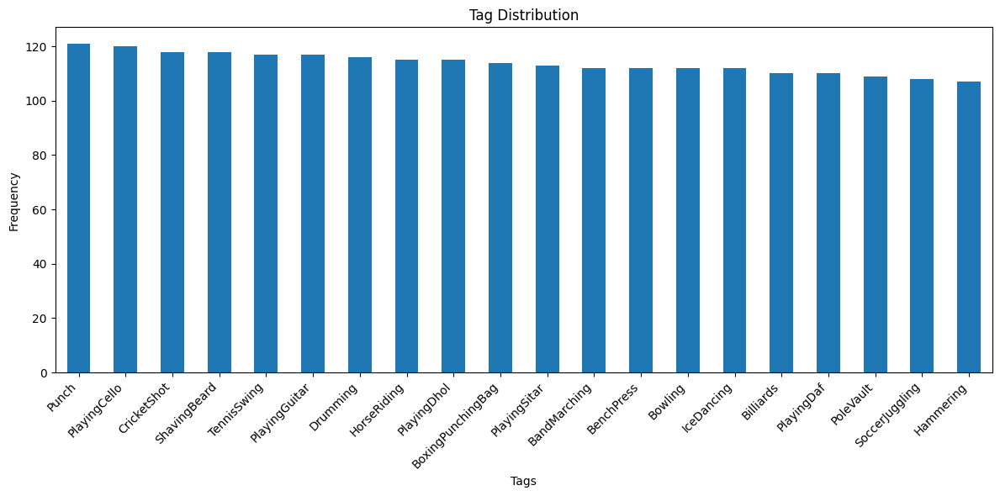

In [ ]:
tag_counts = train_dataset['tag'].value_counts()

plt.figure(figsize=(12, 6))
tag_counts.plot(kind='bar')
plt.title('Tag Distribution')
plt.xlabel('Tags')
plt.ylabel('Frequency')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Here we check the amount of videos per action and see that the top 20 actions are fairly balanced.

In [ ]:
import cv2

For training the model we are going to be using seperate frames from each video and then passing it through the neural network. To understand the frame counts of the videos we will output the minimum frames, average frames, and the maximum frames.
Min frames: 32
Avg frames: 222.41
Max frames: 641

# Data Preprocessing


In [ ]:
def load_video_tensor(video_path, num_frames=16, resize=(64, 64)):
    cap = cv2.VideoCapture(video_path)

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total_frames == 0:
        raise ValueError(f"Could not open video file: {video_path}")

    # Instead of raising an error for short videos, we'll handle them differently
    if total_frames < num_frames:
        print(f"Warning: Video {video_path} has only {total_frames} frames, which is less than {num_frames} requested.")
        # Option 1: We can duplicate the last frame to reach num_frames
        frame_indices = np.linspace(0, total_frames - 1, total_frames, dtype=int)
    else:
        frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)

    frames = []

    for i in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            break
        if i in frame_indices:
            frame = cv2.resize(frame, resize)
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frame = frame.astype("float32") / 255.0  # Normalize to [0, 1]
            frames.append(frame)

    cap.release()

    # Handle the case where we couldn't extract enough frames
    if len(frames) < num_frames:
        # Option 1: Duplicate the last frame
        last_frame = frames[-1] if frames else np.zeros((resize[0], resize[1], 3), dtype=np.float32)
        while len(frames) < num_frames:
            frames.append(last_frame.copy())

    return np.stack(frames)

In [ ]:
X_train = []
y_train = []

for idx, row in train_dataset.iterrows():
    try:
        class_name = row['tag']
        video_name = row['video_name']
        full_path = os.path.join(video_dir, video_name)

        # Check if file exists
        if not os.path.exists(full_path):
            print(f"Warning: Video file not found: {full_path}")
            continue

        video_tensor = load_video_tensor(full_path, num_frames=16, resize=(64, 64))

        X_train.append(video_tensor)
        y_train.append(class_name)

        # Print progress occasionally
        if idx % 100 == 0:
            print(f"Processed {idx} videos...")

    except Exception as e:
        print(f"Error processing video {full_path}: {str(e)}")
        continue

Processed 0 videos...
Processed 100 videos...
Processed 200 videos...
Processed 300 videos...
Processed 400 videos...
Processed 500 videos...
Processed 600 videos...
Processed 700 videos...
Processed 800 videos...
Processed 900 videos...
Processed 1000 videos...
Processed 1100 videos...
Processed 1200 videos...
Processed 1300 videos...
Processed 1400 videos...
Processed 1500 videos...
Processed 1600 videos...
Processed 1700 videos...
Processed 1800 videos...
Processed 1900 videos...
Processed 2000 videos...
Processed 2100 videos...
Processed 2200 videos...


In [ ]:
X_train = np.array(X_train)
y_train = np.array(y_train)

In [ ]:
print(X_train[0])

[[[[0.38431373 0.37254903 0.3882353 ]
   [0.67058825 0.65882355 0.6745098 ]
   [0.91764706 0.90588236 0.92156863]
   ...
   [0.16862746 0.18039216 0.08627451]
   [0.05490196 0.06666667 0.        ]
   [0.20392157 0.21568628 0.12156863]]

  [[0.25882354 0.24705882 0.2627451 ]
   [0.5176471  0.5058824  0.52156866]
   [0.5764706  0.5647059  0.5803922 ]
   ...
   [0.16470589 0.18039216 0.08627451]
   [0.09019608 0.10196079 0.00784314]
   [0.18431373 0.19607843 0.10196079]]

  [[0.23529412 0.22352941 0.23921569]
   [0.39607844 0.38431373 0.4       ]
   [0.5568628  0.54509807 0.56078434]
   ...
   [0.10588235 0.12941177 0.02352941]
   [0.08627451 0.10980392 0.00392157]
   [0.16078432 0.18431373 0.07843138]]

  ...

  [[0.44313726 0.42352942 0.41960785]
   [0.39215687 0.37254903 0.36862746]
   [0.35686275 0.3372549  0.33333334]
   ...
   [0.14117648 0.1764706  0.21960784]
   [0.11372549 0.14901961 0.19215687]
   [0.11372549 0.14901961 0.19215687]]

  [[0.3882353  0.36862746 0.37254903]
   [0.3

In [ ]:
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (2276, 16, 64, 64, 3)
y_train shape: (2276,)


In [ ]:
print(y_train[0])

BandMarching


In [ ]:
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)


num_classes = len(label_encoder.classes_)
y_train_categorical = to_categorical(y_train_encoded, num_classes)
print(f"y_train shape: {y_train_categorical.shape}")

y_train shape: (2276, 20)


#Model Building

In [ ]:
num_frames = 16
height = 64
width = 64
channels = 3
num_classes = len(label_encoder.classes_)


model = Sequential([
    # First CNN block
    TimeDistributed(Conv2D(16, (3, 3), activation='relu', padding='same'),
                   input_shape=(num_frames, height, width, channels)),
    TimeDistributed(MaxPooling2D(pool_size=(2, 2))),

    # Second CNN block
    TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same')),
    TimeDistributed(MaxPooling2D(pool_size=(2, 2))),

    # Add one more pooling to reduce dimensions further
    TimeDistributed(MaxPooling2D(pool_size=(2, 2))),

    # Flatten with controlled output dimension
    TimeDistributed(Flatten()),

    # Add a Dense layer to control the dimension before GRU
    TimeDistributed(Dense(128, activation='relu')),

    # GRU layer
    GRU(128, return_sequences=False),

    # Output layers
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])



/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_7              │ (None, 16, 64, 64, 16) │           448 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 16, 32, 32, 16) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_9              │ (None, 16, 32, 32, 32) │         4,640 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_10             │ (None, 16, 16, 16, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_11             │ (None, 16, 8, 8, 32)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_12             │ (None, 16, 2048)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_13             │ (None, 16, 128)        │       262,272 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_1 (GRU)                     │ (None, 128)            │        99,072 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 20)             │         1,300 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 375,988 (1.43 MB)

 Trainable params: 375,988 (1.43 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = model.fit(
    X_train, y_train_categorical,
    epochs=10,
    batch_size=16,
    validation_split=0.2,
    verbose=1
)

Epoch 1/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 58s 470ms/step - accuracy: 0.0971 - loss: 2.8803 - val_accuracy: 0.0000e+00 - val_loss: 4.6077
Epoch 2/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 460ms/step - accuracy: 0.3443 - loss: 2.0312 - val_accuracy: 0.0000e+00 - val_loss: 6.7022
Epoch 3/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 457ms/step - accuracy: 0.5294 - loss: 1.3827 - val_accuracy: 0.0000e+00 - val_loss: 8.3223
Epoch 4/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 454ms/step - accuracy: 0.7223 - loss: 0.8744 - val_accuracy: 0.0000e+00 - val_loss: 10.0006
Epoch 5/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 452ms/step - accuracy: 0.8604 - loss: 0.4849 - val_accuracy: 0.0000e+00 - val_loss: 11.8190
Epoch 6/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 52s 459ms/step - accuracy: 0.8886 - loss: 0.4216 - val_accuracy: 0.0000e+00 - val_loss: 11.7953
Epoch 7/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 88s 771ms/step - accuracy: 0.9274 - loss: 0.2599 - val_accuracy: 0.0000e+00 - val_loss: 12.3925
Epoch 8/10
114/114 ━━━━━━━━━━━━━━━━━━━━ 54s 472ms/s

#Model Analysis

In [ ]:
def predict_video_action(model, video_path, label_encoder, num_frames=16, resize=(64, 64)):
    # Load and preprocess the video
    video_tensor = load_video_tensor(video_path, num_frames=num_frames, resize=resize)

    # Add batch dimension
    video_tensor = np.expand_dims(video_tensor, axis=0)

    # Get prediction
    prediction = model.predict(video_tensor)[0]

    # Get top predicted class
    predicted_class_index = np.argmax(prediction)
    predicted_class = label_encoder.classes_[predicted_class_index]
    confidence = prediction[predicted_class_index] * 100

    print(f"Predicted action: {predicted_class} (Confidence: {confidence:.2f}%)")

    # Show top 3 predictions
    top_indices = np.argsort(prediction)[::-1][:3]
    print("\nTop 3 predictions:")
    for i, idx in enumerate(top_indices):
        class_name = label_encoder.classes_[idx]
        class_confidence = prediction[idx] * 100
        print(f"{i+1}. {class_name}: {class_confidence:.2f}%")

    return predicted_class, confidence



In [ ]:
def visualize_prediction(video_path, predicted_class, confidence, num_frames=16, resize=(64, 64)):
    # Load video for visualization
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Get sample frames
    sample_indices = np.linspace(0, total_frames - 1, 4, dtype=int)
    sample_frames = []

    for i in range(total_frames):
        ret, frame = cap.read()
        if not ret:
            break
        if i in sample_indices:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            sample_frames.append(frame)

    cap.release()

    # Plot frames and prediction
    plt.figure(figsize=(15, 10))
    for i, frame in enumerate(sample_frames):
        plt.subplot(2, 2, i+1)
        plt.imshow(frame)
        plt.axis('off')

    plt.suptitle(f"Predicted Action: {predicted_class} (Confidence: {confidence:.2f}%)",
                fontsize=16)
    plt.tight_layout()
    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted action: Bowling (Confidence: 99.98%)

Top 3 predictions:
1. Bowling: 99.98%
2. Hammering: 0.01%
3. Punch: 0.00%
Actual Action: Bowling
Predicted action: Bowling (Confidence: 99.98%)


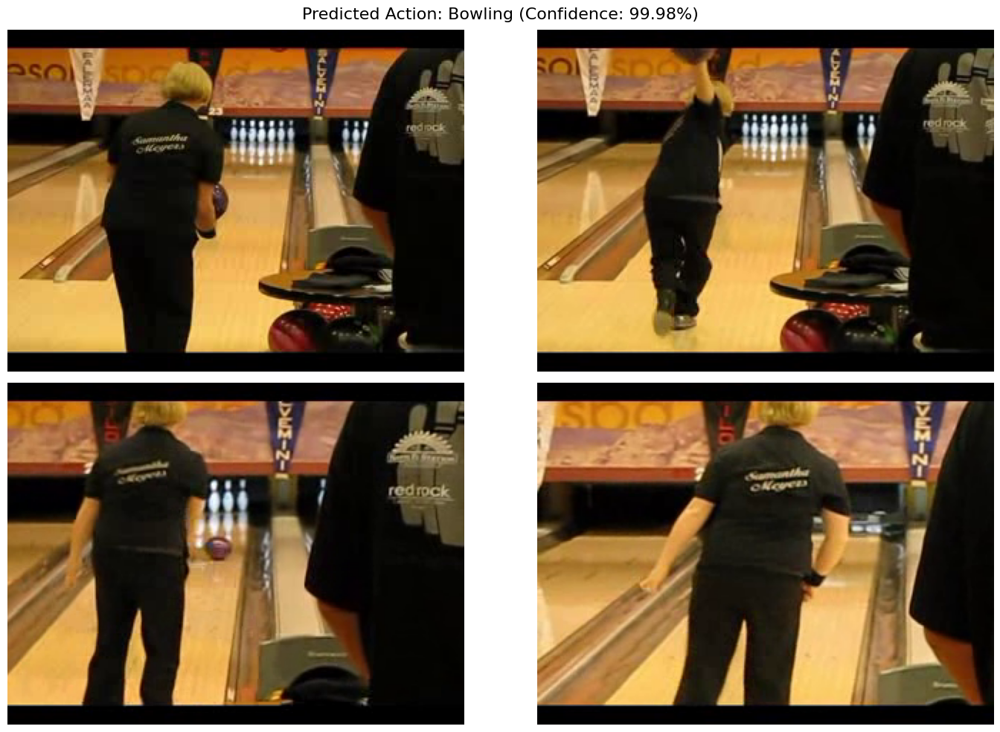

In [ ]:
test_video_path = "/content/train/v_Bowling_g08_c07.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Bowling")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted action: Drumming (Confidence: 99.93%)

Top 3 predictions:
1. Drumming: 99.93%
2. BenchPress: 0.05%
3. PlayingSitar: 0.01%
Actual Action: Drumming
Predicted action: Drumming (Confidence: 99.93%)


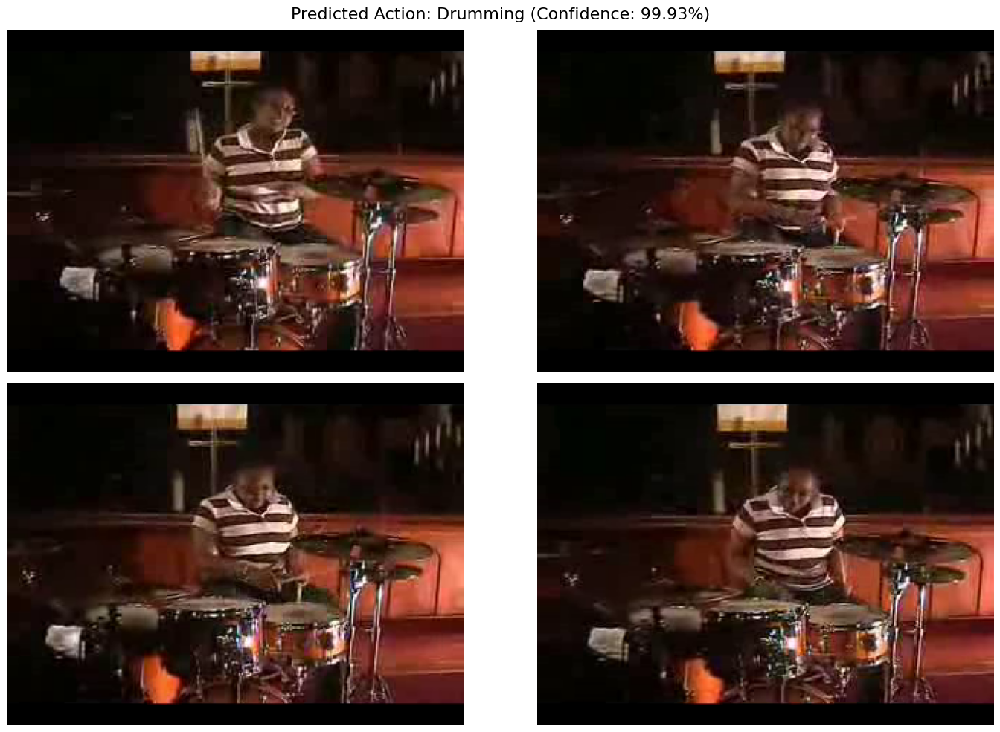

In [ ]:
test_video_path = "/content/train/v_Drumming_g19_c02.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Drumming")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Predicted action: PoleVault (Confidence: 99.71%)

Top 3 predictions:
1. PoleVault: 99.71%
2. PlayingDaf: 0.14%
3. HorseRiding: 0.12%
Actual Action: Pole Vault
Predicted action: PoleVault (Confidence: 99.71%)


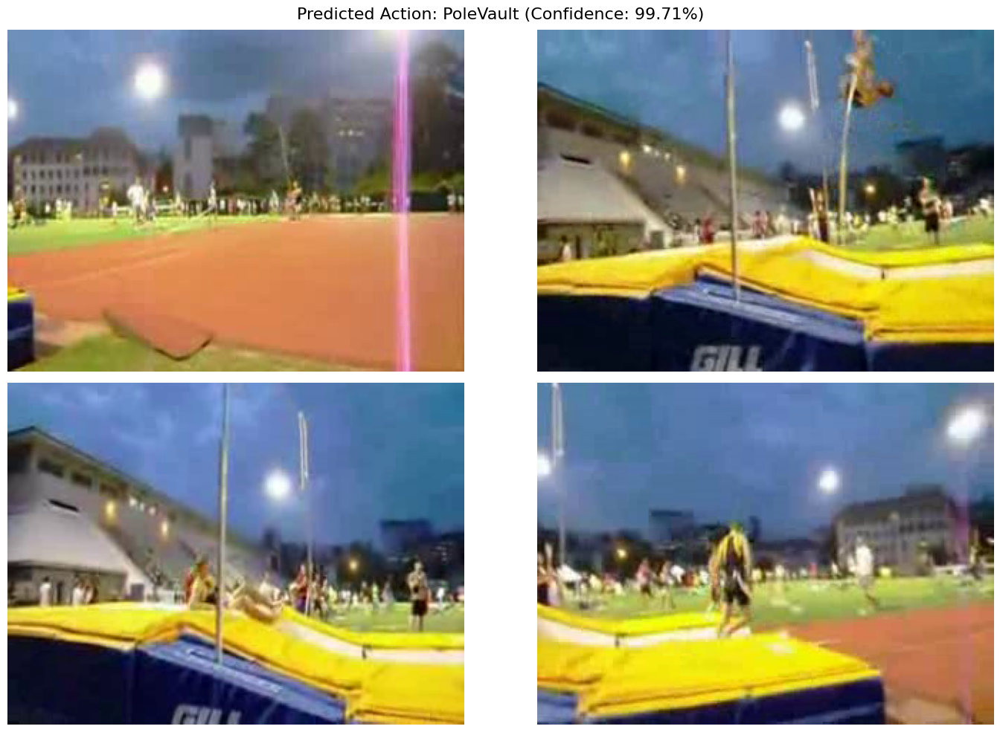

In [ ]:
test_video_path = "/content/test/v_PoleVault_g06_c04.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Pole Vault")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Predicted action: BoxingPunchingBag (Confidence: 63.60%)

Top 3 predictions:
1. BoxingPunchingBag: 63.60%
2. BenchPress: 34.42%
3. PlayingDhol: 1.02%
Actual Action: Playing Sitar
Predicted action: BoxingPunchingBag (Confidence: 63.60%)


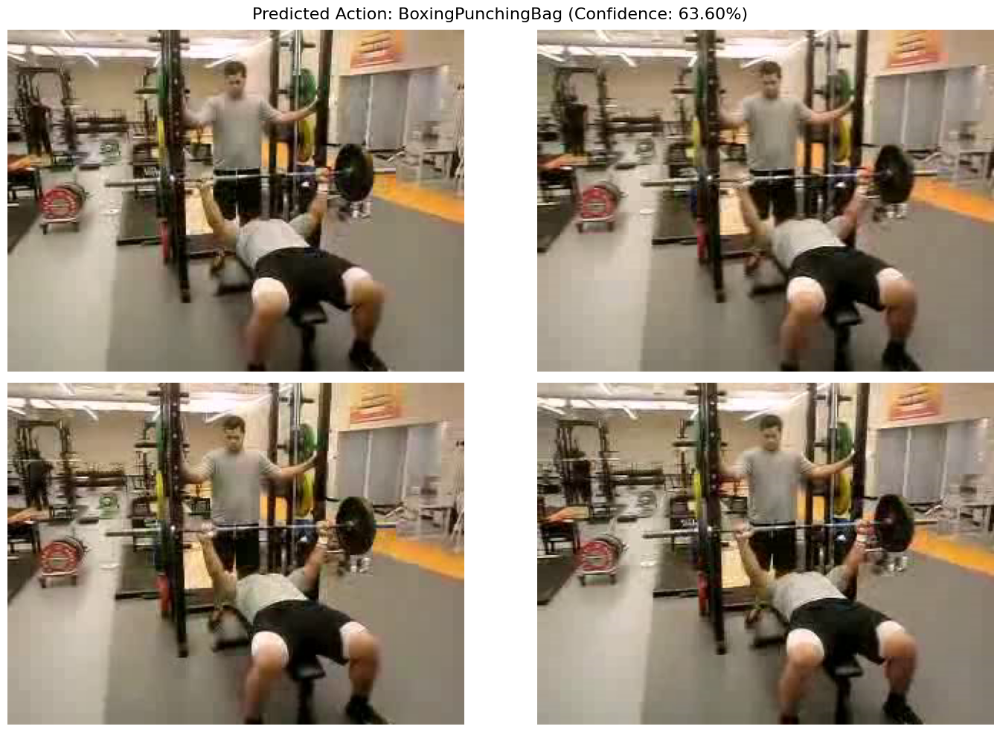

In [ ]:
test_video_path = "/content/test/v_BenchPress_g05_c01.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Bench Press")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Predicted action: BenchPress (Confidence: 99.08%)

Top 3 predictions:
1. BenchPress: 99.08%
2. PlayingDhol: 0.62%
3. Drumming: 0.22%
Actual Action: Bench Press
Predicted action: BenchPress (Confidence: 99.08%)


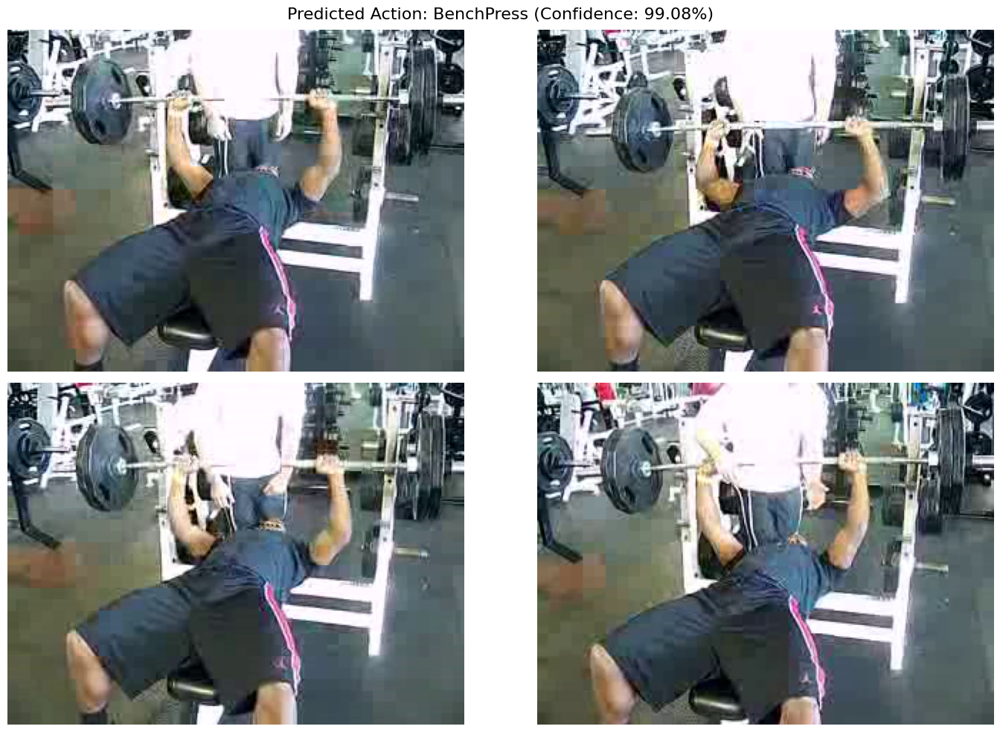

In [ ]:
test_video_path = "/content/test/v_BenchPress_g02_c03.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Bench Press")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Predicted action: PlayingGuitar (Confidence: 44.26%)

Top 3 predictions:
1. PlayingGuitar: 44.26%
2. PlayingDaf: 29.62%
3. BoxingPunchingBag: 12.15%


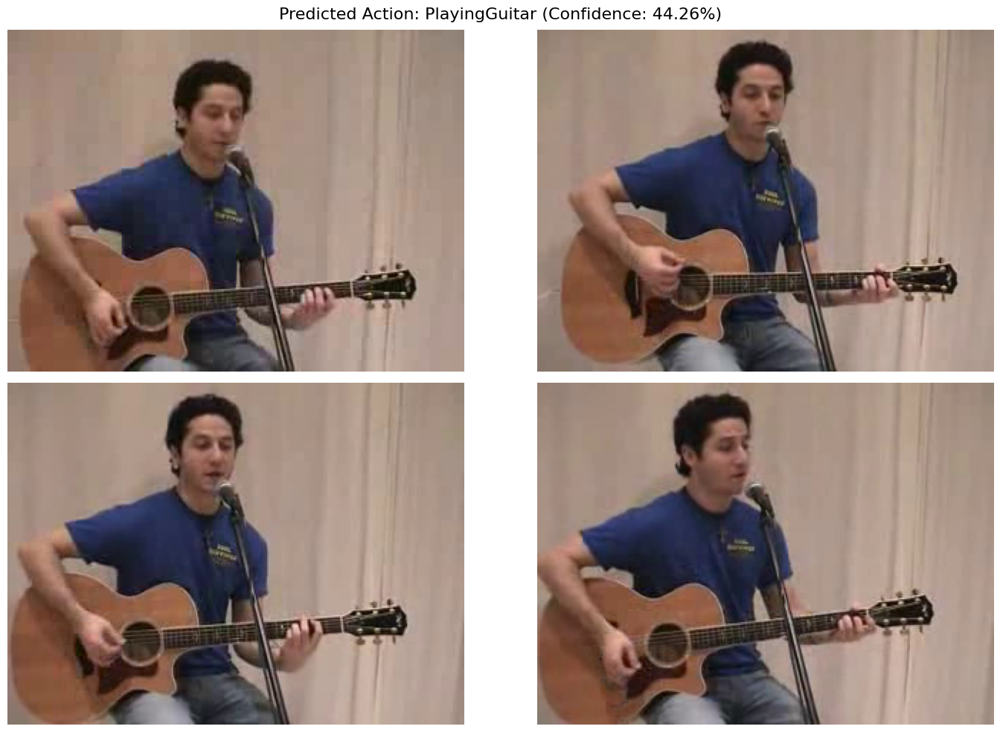

In [ ]:
test_video_path = "/content/test/v_PlayingGuitar_g01_c02.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Predicted action: BandMarching (Confidence: 99.93%)

Top 3 predictions:
1. BandMarching: 99.93%
2. Drumming: 0.03%
3. Bowling: 0.02%
Actual Action: Bench Press
Predicted action: BandMarching (Confidence: 99.93%)


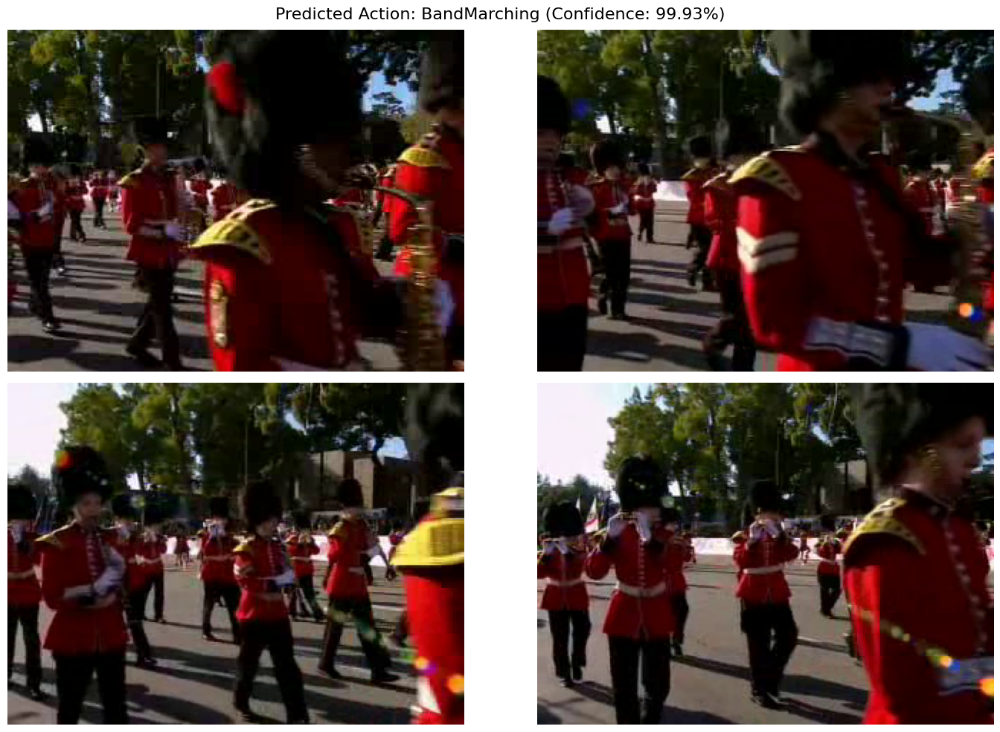

In [ ]:
test_video_path = "/content/test/v_BandMarching_g07_c06.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Bench Press")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

# Encode labels
label_encoder = LabelEncoder()
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)  # Use the same encoder

num_classes = len(label_encoder.classes_)
y_train_categorical = to_categorical(y_train_encoded, num_classes)
y_val_categorical = to_categorical(y_val_encoded, num_classes)

In [ ]:
def build_model(num_frames, height, width, channels, num_classes):
    model = Sequential([
        # CNN block 1
        TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'),
                        input_shape=(num_frames, height, width, channels)),
        TimeDistributed(MaxPooling2D(pool_size=(2, 2))),

        # CNN block 2
        TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same')),
        TimeDistributed(MaxPooling2D(pool_size=(2, 2))),

        # Flatten and project
        TimeDistributed(Flatten()),
        TimeDistributed(Dense(128, activation='relu')),

        # GRU for temporal modeling
        GRU(64),

        # Final classification
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])

    # Use Adam optimizer with a lower learning rate
    optimizer = Adam(learning_rate=0.0005)

    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']  # Add top-k accuracy
    )

    return model

In [ ]:
model = build_model(num_frames, height, width, channels, num_classes)
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/wrapper.py:27: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_50             │ (None, 16, 64, 64, 32) │           896 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_51             │ (None, 16, 32, 32, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_52             │ (None, 16, 32, 32, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_53             │ (None, 16, 16, 16, 64) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_54             │ (None, 16, 16384)      │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_55             │ (None, 16, 128)        │     2,097,280 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_8 (GRU)                     │ (None, 64)             │        37,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 20)             │         1,300 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,155,220 (8.22 MB)

 Trainable params: 2,155,220 (8.22 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
callbacks = [
    EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
]


In [ ]:
history = model.fit(
    X_train, y_train_categorical,
    validation_data=(X_val, y_val_categorical),
    epochs=50,
    batch_size=16,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 157s 1s/step - accuracy: 0.1133 - loss: 2.9236 - val_accuracy: 0.3838 - val_loss: 2.0544
Epoch 2/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 113s 988ms/step - accuracy: 0.4029 - loss: 1.9900 - val_accuracy: 0.6118 - val_loss: 1.3905
Epoch 3/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 112s 980ms/step - accuracy: 0.6505 - loss: 1.2588 - val_accuracy: 0.7675 - val_loss: 0.9263
Epoch 4/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 111s 975ms/step - accuracy: 0.7988 - loss: 0.8017 - val_accuracy: 0.8311 - val_loss: 0.6711
Epoch 5/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 111s 973ms/step - accuracy: 0.8984 - loss: 0.4854 - val_accuracy: 0.9057 - val_loss: 0.4278
Epoch 6/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - accuracy: 0.9470 - loss: 0.3019 - val_accuracy: 0.9057 - val_loss: 0.3702
Epoch 7/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 139s 1s/step - accuracy: 0.9629 - loss: 0.2216 - val_accuracy: 0.9123 - val_loss: 0.3131
Epoch 8/50
114/114 ━━━━━━━━━━━━━━━━━━━━ 112s 984ms/step - accuracy: 0.9817 - loss: 0.

In [ ]:
from tensorflow.keras.metrics import TopKCategoricalAccuracy

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy', TopKCategoricalAccuracy(k=5)]
)

val_loss, val_acc, val_top_k_acc = model.evaluate(X_val, y_val_categorical, verbose=1)
print(f"Validation Loss: {val_loss:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")
print(f"Validation Top-5 Accuracy: {val_top_k_acc:.4f}")

15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 212ms/step - accuracy: 0.9430 - loss: 0.2171 - top_k_categorical_accuracy: 0.9833
Validation Loss: 0.2088
Validation Accuracy: 0.9430
Validation Top-5 Accuracy: 0.9890


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted action: TennisSwing (Confidence: 97.55%)

Top 3 predictions:
1. TennisSwing: 97.55%
2. SoccerJuggling: 1.55%
3. PlayingDaf: 0.34%
Actual Action: Tennis Swing
Predicted action: TennisSwing (Confidence: 97.55%)


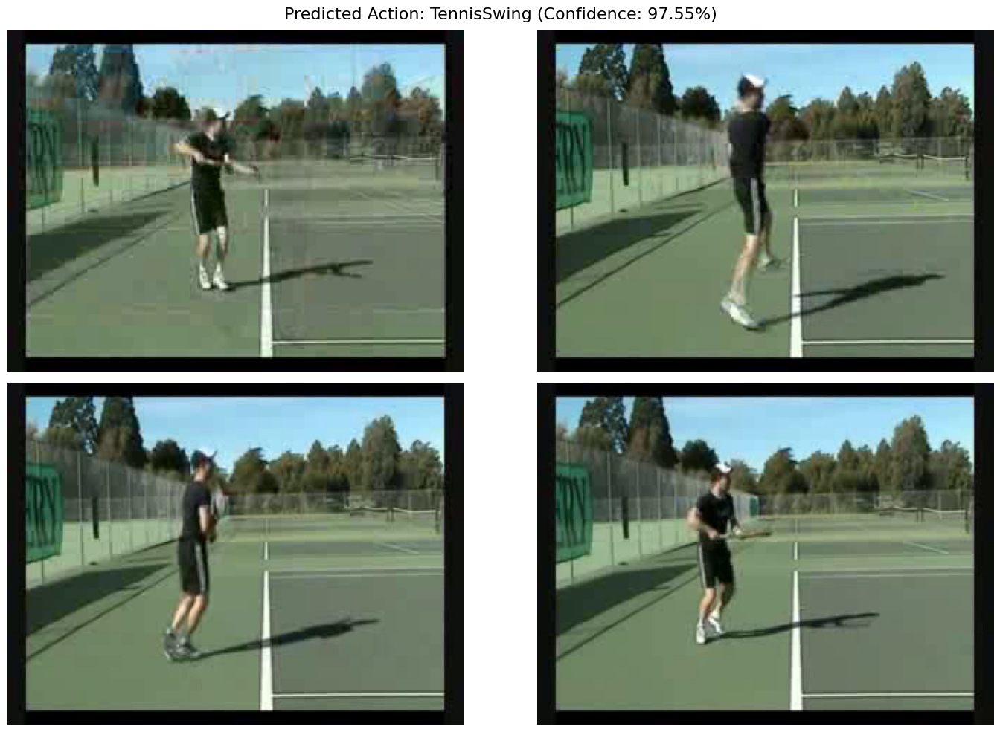

In [ ]:
test_video_path = "/content/test/v_TennisSwing_g03_c07.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Tennis Swing")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Predicted action: Drumming (Confidence: 99.51%)

Top 3 predictions:
1. Drumming: 99.51%
2. PlayingSitar: 0.13%
3. BandMarching: 0.13%
Actual Action: Tennis Swing
Predicted action: Drumming (Confidence: 99.51%)


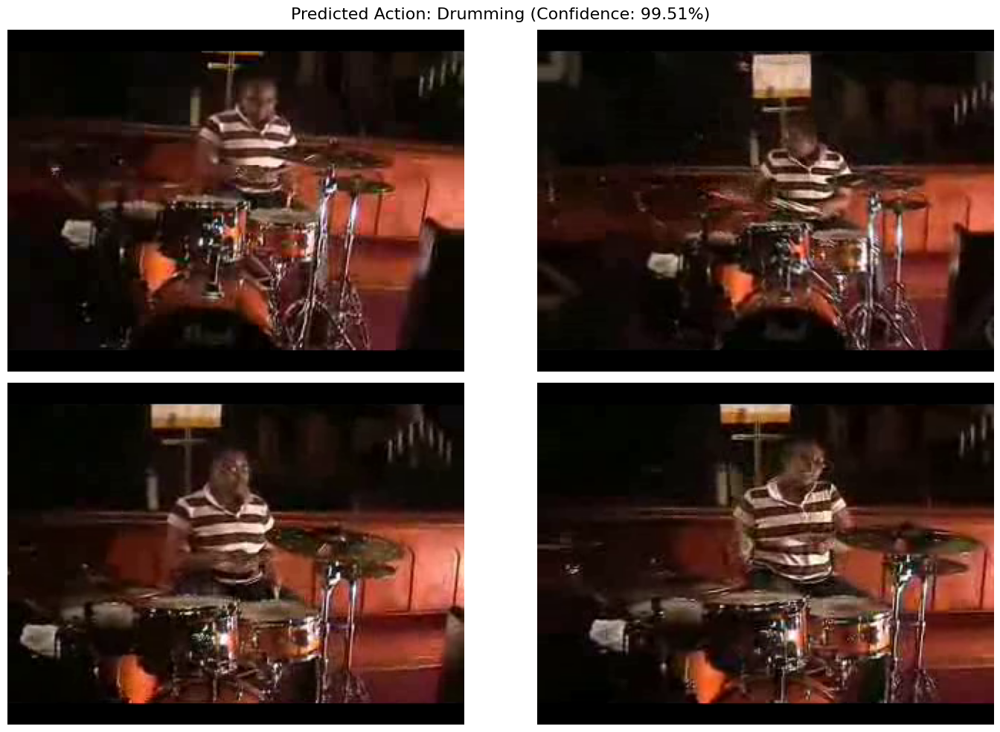

In [ ]:
test_video_path = "/content/train/v_Drumming_g19_c01.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Tennis Swing")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Predicted action: HorseRiding (Confidence: 99.48%)

Top 3 predictions:
1. HorseRiding: 99.48%
2. PoleVault: 0.17%
3. SoccerJuggling: 0.12%
Actual Action: Tennis Swing
Predicted action: HorseRiding (Confidence: 99.48%)


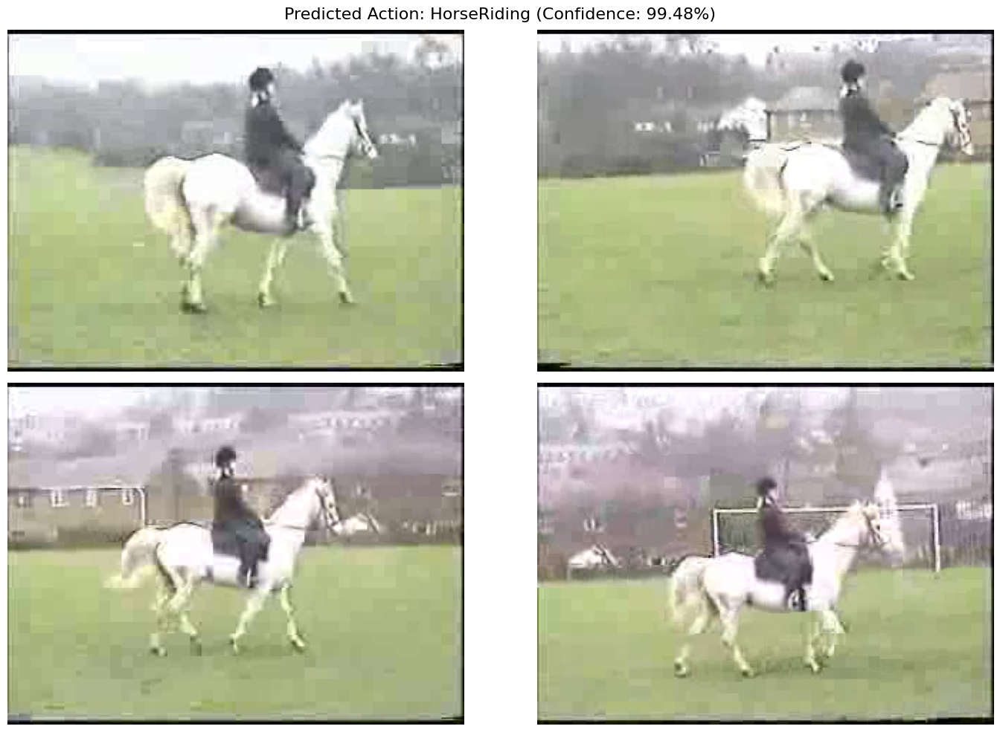

In [ ]:
test_video_path = "/content/train/v_HorseRiding_g13_c01.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Tennis Swing")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Predicted action: Hammering (Confidence: 99.72%)

Top 3 predictions:
1. Hammering: 99.72%
2. Bowling: 0.06%
3. BandMarching: 0.05%
Actual Action: Hammering
Predicted action: Hammering (Confidence: 99.72%)


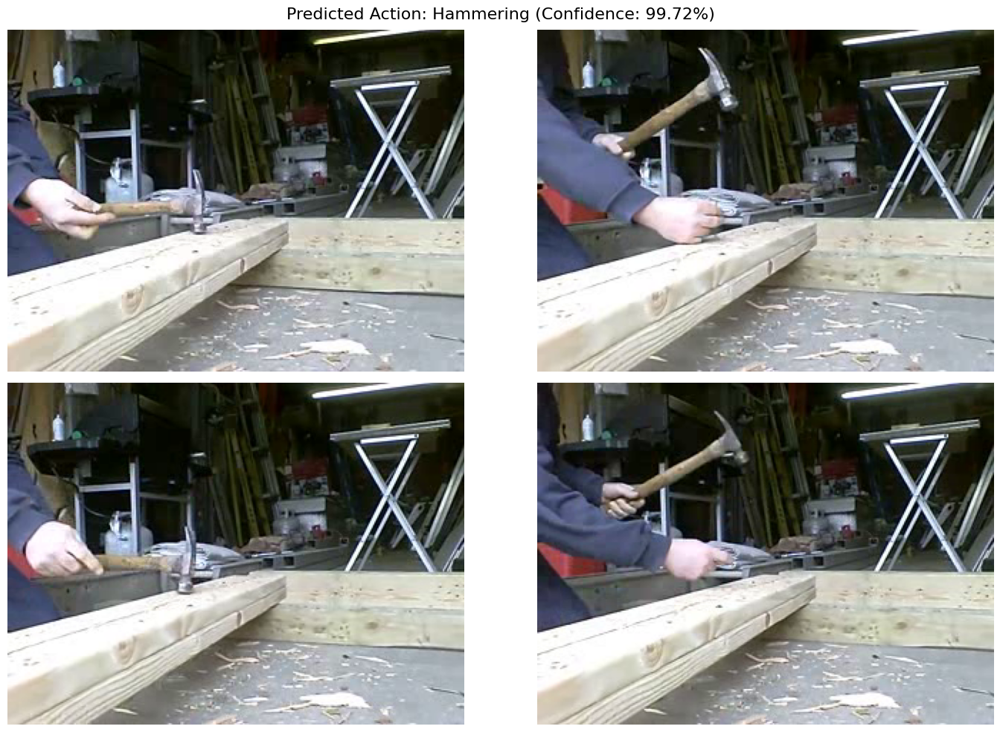

In [ ]:
test_video_path = "/content/train/v_Hammering_g20_c04.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Hammering")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Predicted action: TennisSwing (Confidence: 98.72%)

Top 3 predictions:
1. TennisSwing: 98.72%
2. SoccerJuggling: 0.92%
3. IceDancing: 0.13%
Actual Action: Soccer Juggling
Predicted action: TennisSwing (Confidence: 98.72%)


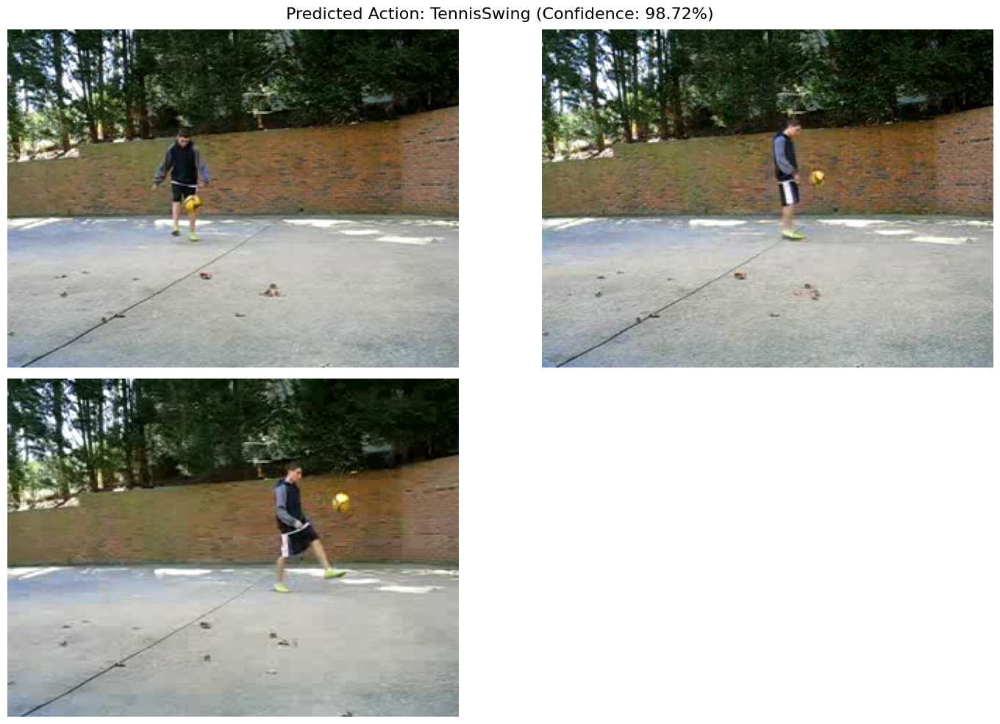

In [ ]:
test_video_path = "/content/test/v_SoccerJuggling_g05_c01.avi"
predicted_action, confidence = predict_video_action(model, test_video_path, label_encoder)

print("Actual Action: Soccer Juggling")
print(f"Predicted action: {predicted_action} (Confidence: {confidence:.2f}%)")
visualize_prediction(test_video_path, predicted_action, confidence)

#Conclusions

I was initially having issues running the model because I was exceeding the allotted memory amount so I switched to a simpler model using GRU layers. I wanted to build a 3D CNN model and see how that worked. The model was able to classify a lot of different actions but it is evident that it gets plenty of actions wrong. Some methods I plan to try are deeper layers like 3D CNNs or stacked GRUs. Also using data augmentation to increase the training samples to help the model find more specific patterns. Also the method for finding samples may need to be altered since some of the videos have less frames.

#References

Dataset Subsample: https://colab.research.google.com/github/sayakpaul/Action-Recognition-in-TensorFlow/blob/main/Data_Preparation_UCF101.ipynb

https://keras.io/examples/vision/video_classification/

https://blog.coast.ai/five-video-classification-methods-implemented-in-keras-and-tensorflow-99cad29cc0b5


